# 1. Import packages

In [9]:
import os
import numpy as np
import xarray as xr 
import matplotlib
import matplotlib.pylab as plt 
import matplotlib.ticker as mticker
import cmocean 
from scipy.interpolate import RegularGridInterpolator
import pickle
import gc
from matplotlib import cm 
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

import sys
sys.path.append('..')
from src.mod_plot import *
from src.mod_traj import *
from src.mod_compare import regional_zoom

# 2. Setup parameters

In [10]:
method_name = 'UnetL4_global'

time_min = '2019-01-01'                                        # time min for analysis
time_max = '2019-12-31'                                        # time max for analysis 

dir_out = f'../results/'                               # output directory path 
prefix_out = 'dict_drifter_adv'
results_out = 'deviat_uv_'+method_name+'.nc'

if not os.path.exists(dir_out):
    os.system('mkdir '+dir_out)

# Global
lon_min = 0                                          # domain min longitude
lon_max = 360                                          # domain max longitude
#lon_min = -180                                          # domain min longitude
#lon_max = 180                                          # domain max longitude
lat_min = -90.                                          # domain min latitude
lat_max = 90.                                          # domain max latitude 


# 3. Maps to evaluate

## 3.1 Download maps

In [11]:
result_filepath = "/Odyssey/private/t22picar/4dvarnet-uv/rec/multivar_mapping_ssh_sst_to_u_v_test_L4_1y/2019_global_4/test_data_dim0.nc"
res_uo = xr.open_dataset(result_filepath).sel(time=slice(time_min, time_max))
res_uo = res_uo.rename({'out': 'ugos'})

result_filepath = "/Odyssey/private/t22picar/4dvarnet-uv/rec/multivar_mapping_ssh_sst_to_u_v_test_L4_1y/2019_global_4/test_data_dim1.nc"
res_vo = xr.open_dataset(result_filepath).sel(time=slice(time_min, time_max))
res_vo = res_vo.rename({'out': 'vgos'})

# Fusionner les deux datasets
maps = xr.merge([res_uo, res_vo])
maps = maps.rename({'lat': 'latitude'})
maps = maps.rename({'lon': 'longitude'})
#maps = maps.assign(longitude=maps.longitude.values + 180)

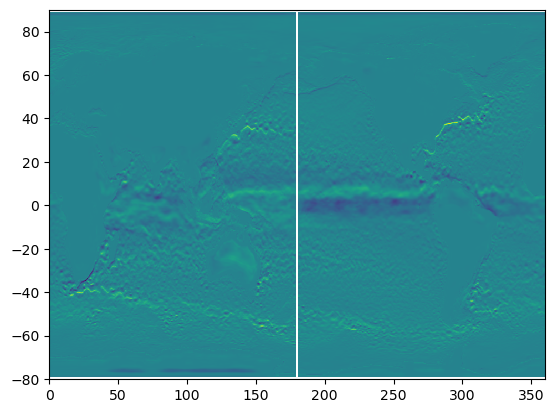

In [12]:
time = maps.time.values

lon = maps.longitude.values
lon[lon<0] = 360 + lon[lon<0] #?
maps = maps.sortby('longitude')

lon = maps.longitude.values
lat = maps.latitude.values 

u_maps = maps.ugos
v_maps = maps.vgos

time = (time.astype('datetime64[h]') - np.datetime64('2019-01-01')).astype(int)
Nt = time[-1] 


plt.pcolormesh(lon,lat,maps.ugos[0])

In [13]:
#maps['longitude'] = xr.where(maps['longitude'] < 0, maps['longitude'] + 360, maps['longitude'])
#lat_simu = maps.latitude.values
#lon_simu = maps.longitude.values

## 3.2 Retrieve maps info 

# 4. Independant drifters

## 4.1 Download drifters

In [14]:
#from glob import glob
#filenames_drifters = sorted(glob('../data/independent_drifters/uv_drifters_*.nc'))
#ds_drifters = xr.open_mfdataset(filenames_drifters, combine='nested', concat_dim='time')
#ds_drifters = ds_drifters.where((ds_drifters.time >= np.datetime64(time_min)) & (ds_drifters.time <=  np.datetime64(time_max)), drop=True)
#ds_drifters

In [15]:
path_drifters = '../data/independent_drifters/uv*'
ds_drifters = xr.open_mfdataset(path_drifters,concat_dim='time',combine='nested')
ds_drifters.load()

<xarray.Dataset>
Dimensions:    (time: 2156405)
Coordinates:
  * time       (time) datetime64[ns] 2019-01-01 ... 2019-12-31
    latitude   (time) float32 -20.17 -20.12 -20.07 ... -12.31 -16.64 -32.11
    longitude  (time) float32 87.07 87.05 87.03 86.98 ... 86.61 121.6 95.08
Data variables:
    EWCT       (time) float32 -0.1013 -0.0971 -0.1572 ... -0.04298 -0.07795
    NSCT       (time) float32 0.2415 0.2573 0.2443 ... -0.1032 0.03121 -0.1021
    sensor_id  (time) float64 1.163e+05 1.163e+05 ... 6.822e+07 6.831e+07
Attributes: (12/46)
    data_type:                   OceanSITES trajectory data
    format_version:              2.0
    platform_code:               116275
    date_update:                 2020-10-13T12:17:40Z
    institution:                 AOML
    institution_edmo_code:       1799
    ...                          ...
    deployment_lat:              -58.44
    last_longitude_observation:  82.75
    last_latitude_observation:   -18.49
    date_drog_lost:              2017-01-21T03:37:00Z
    death_type:                  stop transmitting
    last_date_observation:       2019-01-16T01:51:00Z

## 4.2 Prepare drifter data

In [16]:
%%time
ind, time_drifter, lon_drifter, lat_drifter, id_drifter= prepare_drifter_data(ds_drifters,maps)

CPU times: user 404 ms, sys: 85.1 ms, total: 489 ms
Wall time: 487 ms


(array([133328., 137560., 184092.,  84246., 207608., 287648., 235575.,
        148316., 288740., 423502.]),
 array([8.39999989e-02, 3.60588989e+01, 7.20337982e+01, 1.08008705e+02,
        1.43983597e+02, 1.79958511e+02, 2.15933411e+02, 2.51908310e+02,
        2.87883209e+02, 3.23858093e+02, 3.59833008e+02]),
 <BarContainer object of 10 artists>)

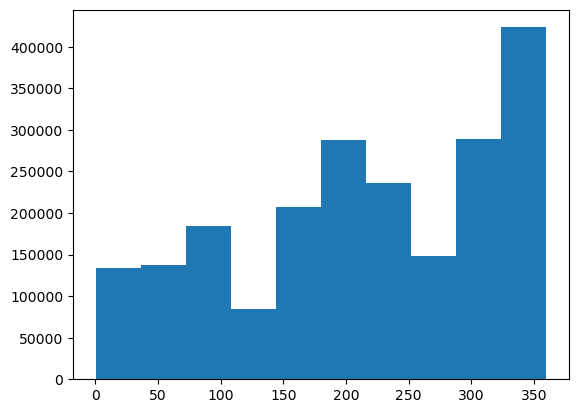

In [17]:
plt.hist(lon_drifter)

# 5. Interpolate maps at drifters locations

In [18]:
%%time

# Create interpolation function
fu = RegularGridInterpolator((time, lat, lon), u_maps.values)
fv = RegularGridInterpolator((time, lat, lon), v_maps.values)

CPU times: user 3.19 s, sys: 647 ms, total: 3.84 s
Wall time: 3.81 s


# 6. Artificial drifter trajectories 

## 6.1 Trajectory parameters and initialization 

In [19]:
nday = 1
dt_h = 24 
mode = 'euler' 
write = False 
Np = time_drifter.size

horizons = np.arange(0,nday*24/dt_h+1)

dict_drifter_adv_maps = {0:{'time':time_drifter,
                           'lon':lon_drifter,
                           'lat':lat_drifter,
                            'id':id_drifter}
                       }
horizons

array([0., 1.])

## 6.2 Compute trajectories

In [26]:
%%time
dict_drifter_adv_maps = compute_traj(dict_drifter_adv_maps, horizons, fu, fv ,Np, Nt, dt_h, method_name, dir_out, prefix_out, mode, write)


h 1.0
Output files already exist. Reading from files. To compute trajectories and write over old files prescribe 'overwrite=True'
CPU times: user 15 ms, sys: 104 ms, total: 119 ms
Wall time: 1.91 s


(array([133328., 137560., 184092.,  84246., 207608., 287648., 235575.,
        148316., 288740., 423502.]),
 array([8.39999989e-02, 3.60588989e+01, 7.20337982e+01, 1.08008705e+02,
        1.43983597e+02, 1.79958511e+02, 2.15933411e+02, 2.51908310e+02,
        2.87883209e+02, 3.23858093e+02, 3.59833008e+02]),
 <BarContainer object of 10 artists>)

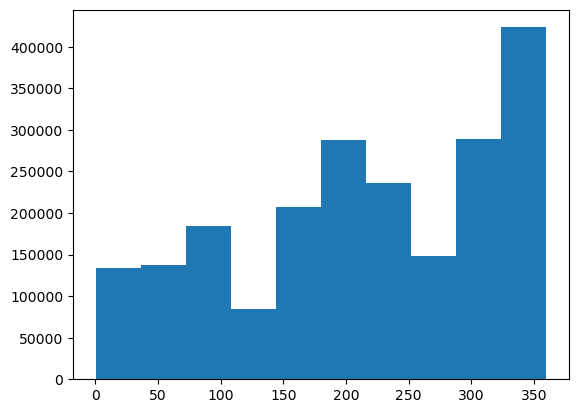

In [27]:
plt.hist(dict_drifter_adv_maps[0]["lon"])

# 7. Compute deviation  

In [36]:
# Deviation = Cumulative distance between artificial and real trajectories

# Average deviation by bins
lon_out=np.arange(lon_min, lon_max, 1)
lat_out=np.arange(lat_min, lat_max, 1)

#horizon_days = [1,2,3,4,5]
horizon_days = [1]
    
dev_maps, var_dev_maps, dmean = compute_deviation(dict_drifter_adv_maps, Nt, dt_h, horizon_days,lon_out,lat_out, dir_out, method_name, results_out,overwrite='True')


180.15
nan
180.09698
nan
180.1
nan
180.192
nan
180.123
nan
180.064
nan
180.04498
nan
180.089
nan
359.78
11.807133428068335
359.78
11.807133428068335
180.241
nan
180.09802
nan
180.20502
nan
359.682
22.719711905292375
359.601
23.417738616881497
180.191
nan
180.742
nan
180.237
nan
180.259
nan
180.178
nan
180.098
nan
180.098
nan
180.07
nan
359.777
20.926106194057358
180.075
nan
180.01501
nan
180.365
nan
180.017
nan
180.029
nan
180.031
nan
180.045
nan
180.039
nan
180.141
nan
180.418
nan
180.384
nan
180.624
nan
180.003
nan
180.003
nan
180.053
nan
180.07898
nan
180.104
nan
180.425
nan
180.034
nan
180.186
nan
180.159
nan
180.104
nan
180.145
nan
180.28
nan
359.701
28.57287774475495
180.166
nan
359.757
36.081743117345574
180.169
nan
180.499
nan
180.026
nan
180.01099
nan
180.368
nan
180.368
nan
180.05
nan
180.43402
nan
180.301
nan
180.12
nan
180.12
nan
180.035
nan
180.48
nan
180.48
nan
180.036
nan
180.121
nan
180.135
nan
359.74
21.104129031636685
180.582
nan
180.582
nan
180.117
nan
180.18298
nan


In [33]:
dev_maps[0,:,:]

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

# 8. Plots

## 8.1 Plot deviation maps at different horizons

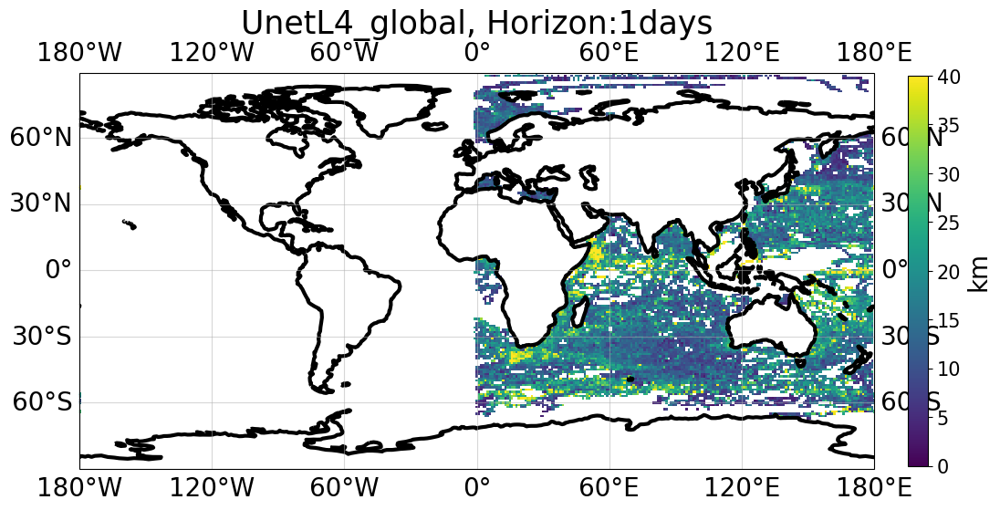

In [24]:
#horizon_plots = [1,2,3,4,5]
horizon_plots = [1]
#horizon_plot_max = [40,80,125,150,200]
horizon_plot_max = [40]

plot_traj_deviation_maps(lon_out, lat_out, dev_maps, dt_h,horizon_plots,horizon_plot_max,method_name) 


## 8.2 Plot spatially averaged deviation as a function of horizons

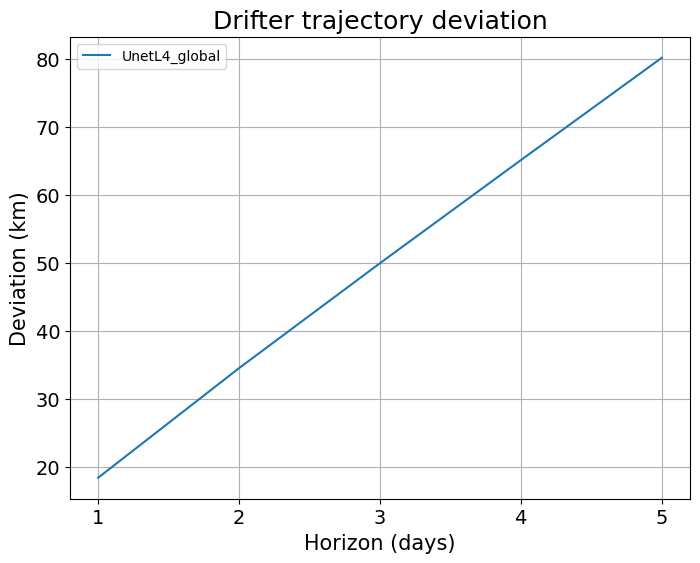

In [24]:
plot_meantraj_deviation(dir_out)

In [ ]:
plot_meantraj_deviation(dir_out, just_basin='global')

In [42]:
def compute_deviation(dict1, Nt, dt_hr, horizon_days,lon_out=np.arange(0, 360, 1),lat_out=np.arange(-90, 90, 1), dir_out='../results/', method_name= 'DUACS', results_out='deviat_uv_DUACS.nc', overwrite=False):
    """
    Compute deviation between real and artificial drifters.

    Parameters
    ----------
    dict1 : dict
        Dictionary containing drifter data.
    Nt : int
        Total number of time steps.
    dt_hr : int
        Time step size in hours.
    horizon_days : list
        List of time horizons for deviation computation.
    lon_out : numpy.ndarray, optional
        Longitudes for output grids. Default is a range from 0 to 360 with a step of 1 degree.
    lat_out : numpy.ndarray, optional
        Latitudes for output grids. Default is a range from -90 to 90 with a step of 1 degree.
    dir_out : str, optional
        Output directory. Default is '../results/'.
    method_name : str, optional
        Name of the deviation method. Default is 'DUACS'.
    results_out : str, optional
        Output file name for deviation results. Default is 'deviat_uv_DUACS.nc'.
    overwrite : bool, optional
        Option to overwrite (if True) or read (if False) output file when file already exists. Default is False.

    Returns
    -------
    rmse_norm : numpy.ndarray
        Normalized root mean square error (RMSE) of deviation.
    var_norm : numpy.ndarray
        Normalized variance of deviation.
    d_mean_1 : numpy.ndarray
        Mean deviation.

    Examples
    --------
    # Usage Example:
    rmse_norm, var_norm, d_mean_1 = compute_deviation(drifter_data, N_time, time_step, horizon_list, lon_grid, lat_grid, dir_out='../output', method_name='DUACS', results_out='deviation_results.nc')
    """

    #print(np.min(lon_out))
        
    if os.path.isfile(f'{dir_out}/{results_out}') and not overwrite :
        print("Output file already exists. Reading from file. To compute deviation and write over old file prescribe 'overwrite=True'")
        
        ds = xr.open_dataset(f'{dir_out}/{results_out}', format="NETCDF4")
        rmse_norm = np.array(ds.deviation_maps.values).T
        var_norm = np.array(ds.var_deviation_maps.values).T
        d_mean_1 = np.array(ds.deviation_mean.values)

        
    else: 
        
        if os.path.isfile(f'{dir_out}/{results_out}'): 
            print("Warning: Overwriting the file f'{dir_out}/{results_out}'")
    
    
        import pyinterp

        d1 = {} 
        lo1 = {} 
        la1 = {} 

        # Compute deviation (dist between real and artif drifters)

        it = 0
        for t in np.arange(dt_hr,Nt,dt_hr):
            #print(t,Nt,end='\r')
            ind0 = (dict1[0]['time']==t) 
            lon0 = dict1[0]['lon'][ind0]
            lat0 = dict1[0]['lat'][ind0]
            id0 = dict1[0]['id'][ind0]
            for h in dict1:
                if h==0:
                    continue
                else:   
                    if h not in d1:
                        d1[h] = [] 
                        lo1[h] = [] 
                        la1[h] = [] 

                    ind1 = dict1[h]['time']==t  



                    lon1 = dict1[h]['lon'][ind1]
                    lat1 = dict1[h]['lat'][ind1]
                    id1 = dict1[h]['id'][ind1]




                    for (_lon0,_lat0,_id0) in zip(lon0,lat0,id0):
                        #print(lon0)
                        if _id0 in id1 : 
                            #if _lon0 > 180:
                                #print(_lon0)
                                #print(dist_drifters(_lat0,_lon0,lat1[id1==_id0],lon1[id1==_id0])[0])
                            d1[h].append(dist_drifters(_lat0,_lon0,lat1[id1==_id0],lon1[id1==_id0])[0]) 
                            lo1[h].append(_lon0)
                            la1[h].append(_lat0)

        d_mean_1 = np.array([np.sqrt(np.nansum(np.array(d1[h])**2)/np.count_nonzero(~np.isnan(d1[h]))) for h in d1])


        binning = pyinterp.Binning2D(pyinterp.Axis(lon_out, is_circle=True),
                                     pyinterp.Axis(lat_out))


        rmse_norm = np.zeros([np.size(horizon_days),np.size(lon_out),np.size(lat_out)]) 
        var_norm = np.zeros([np.size(horizon_days),np.size(lon_out),np.size(lat_out)])  

        for h in horizon_days:
            binning.clear()
            binning = binning.push_delayed(lo1[h], la1[h], d1[h]).compute() 
            rmse_norm[h-1,:,:] = binning.variable('mean')
            var_norm[h-1,:,:] = binning.variable('variance')



        # Save results
        ds1 = xr.Dataset({'deviation_maps' : (('lat', 'lon','horizons'), rmse_norm.T),
                          'var_deviation_maps' : (('lat', 'lon','horizons'), var_norm.T), 
                          'deviation_mean' : (('horizons'), d_mean_1) 
                          },
                          coords={'lon': lon_out, 
                                  'lat': lat_out,
                                  'horizons': horizon_days,
                                   }
                           )


        ds1 = ds1.assign_attrs({'method':method_name})
        ds1.to_netcdf(f'{dir_out}/{results_out}', format="NETCDF4")
        
    return rmse_norm, var_norm, d_mean_1 

In [54]:
def dist_drifters(lat1,lon1,lat2,lon2):
    """
    Calculate the great-circle distance between two sets of coordinates.

    Parameters
    ----------
    lat1 : float
        Latitude of the first point.
    lon1 : float
        Longitude of the first point.
    lat2 : float
        Latitude of the second point.
    lon2 : float
        Longitude of the second point.

    Returns
    -------
    distance : float
        Great-circle distance between the two points in kilometers.

    Examples
    --------
    # Usage Example:
    distance = dist_drifters(lat1, lon1, lat2, lon2)
    """
    
    # Approximate radius of earth in km
    R = 6373.0

    lat1 = np.radians(lat1)

    print("lon1")
    print(lon1)
    lon1 = np.radians(lon1)

    lat2 = np.radians(lat2)

    print("lon2")
    print(lon2)
    lon2 = np.radians(lon2)

        
    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = np.sin(dlat / 2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2)**2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))

    distance = R * c 
    
    return distance

In [55]:
dev_maps, var_dev_maps, dmean = compute_deviation(dict_drifter_adv_maps, Nt, dt_h, horizon_days,lon_out,lat_out, dir_out, method_name, results_out,overwrite='True')

lon1
143.472
lon2
[143.52583066]
lon1
2.3
lon2
[2.177238]
lon1
60.889008
lon2
[60.96228365]
lon1
165.811
lon2
[165.75708376]
lon1
154.112
lon2
[154.08943987]
lon1
128.036
lon2
[128.29416197]
lon1
80.814
lon2
[80.93754344]
lon1
89.556
lon2
[89.67127678]
lon1
161.41498
lon2
[161.21403928]
lon1
60.7
lon2
[60.8727803]
lon1
89.246
lon2
[89.21223437]
lon1
56.101
lon2
[56.15331303]
lon1
112.523
lon2
[112.57503328]
lon1
175.586
lon2
[175.64577494]
lon1
2.371
lon2
[2.33132096]
lon1
95.355
lon2
[95.36606368]
lon1
133.633
lon2
[133.58354584]
lon1
176.373
lon2
[176.30296473]
lon1
156.816
lon2
[156.78542188]
lon1
159.203
lon2
[158.93448299]
lon1
172.241
lon2
[172.11360174]
lon1
35.194
lon2
[35.24261152]
lon1
8.831
lon2
[8.78904671]
lon1
14.187
lon2
[14.39749604]
lon1
28.916
lon2
[28.16729715]
lon1
9.996994
lon2
[10.03725658]
lon1
86.655
lon2
[86.77928146]
lon1
83.989
lon2
[84.11102521]
lon1
0.518
lon2
[0.47516177]
lon1
6.196
lon2
[6.40421578 6.40421578]
lon1
168.484
lon2
[168.56640971]
lon1
6.196
l